In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = '0'

In [2]:
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras import layers, applications, optimizers
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation,GlobalMaxPooling2D
from keras.preprocessing.image import ImageDataGenerator, load_img

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import cv2
import random

In [3]:
tf.debugging.set_log_device_placement(True)

a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [4]:
image_size = 224
batch_size = 32

save_model_filename = 'cassava_vgg.h5'

In [5]:
train = pd.read_csv('./cassava-leaf-disease-classification/train.csv')

In [6]:
train.head(10)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
5,1000837476.jpg,3
6,1000910826.jpg,2
7,1001320321.jpg,0
8,1001723730.jpg,4
9,1001742395.jpg,3


In [7]:
data = {"0":"Cassava Bacterial Blight (CBB)",
        "1":"Cassava Brown Streak Disease (CBSD)",
        "2":"Cassava Green Mottle (CGM)",
        "3":"Cassava Mosaic Disease (CMD)",
        "4":"Healthy"}

disease_label = pd.DataFrame(data=data.values(),index=data.keys(),columns=['Disease_Name'])

In [8]:
disease_label

,Disease_Name
0,Cassava Bacterial Blight (CBB)
1,Cassava Brown Streak Disease (CBSD)
2,Cassava Green Mottle (CGM)
3,Cassava Mosaic Disease (CMD)
4,Healthy


In [9]:
train_path = './cassava-leaf-disease-classification/train_images'

In [10]:
def image_path(image):
    return os.path.join(train_path,image)

train['image_id'] = train['image_id'].apply(image_path)

In [11]:
train.head(10)

,image_id,label
0,./cassava-leaf-disease-classification/train_im...,0
1,./cassava-leaf-disease-classification/train_im...,3
2,./cassava-leaf-disease-classification/train_im...,1
3,./cassava-leaf-disease-classification/train_im...,1
4,./cassava-leaf-disease-classification/train_im...,3
5,./cassava-leaf-disease-classification/train_im...,3
6,./cassava-leaf-disease-classification/train_im...,2
7,./cassava-leaf-disease-classification/train_im...,0
8,./cassava-leaf-disease-classification/train_im...,4
9,./cassava-leaf-disease-classification/train_im...,3


In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  21397 non-null  object
 1   label     21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [13]:
train['label'] = train['label'].astype('str')

C:\Users\pomat\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


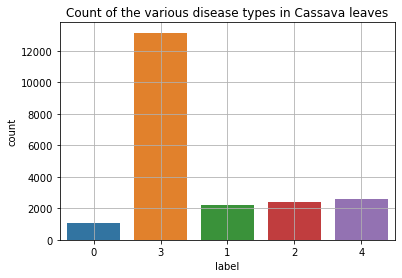

In [14]:
import seaborn as sns

sns.countplot(train['label'])
plt.title('Count of the various disease types in Cassava leaves')
plt.grid()
plt.show()

In [15]:
zero = train[train['label'] == '0']['image_id'].head(12).reset_index(drop=False)
one = train[train['label'] == '1']['image_id'].head(12).reset_index(drop=False)
two = train[train['label'] == '2']['image_id'].head(12).reset_index(drop=False)
three = train[train['label'] == '3']['image_id'].head(12).reset_index(drop=False)
four = train[train['label'] == '4']['image_id'].head(12).reset_index(drop=False)

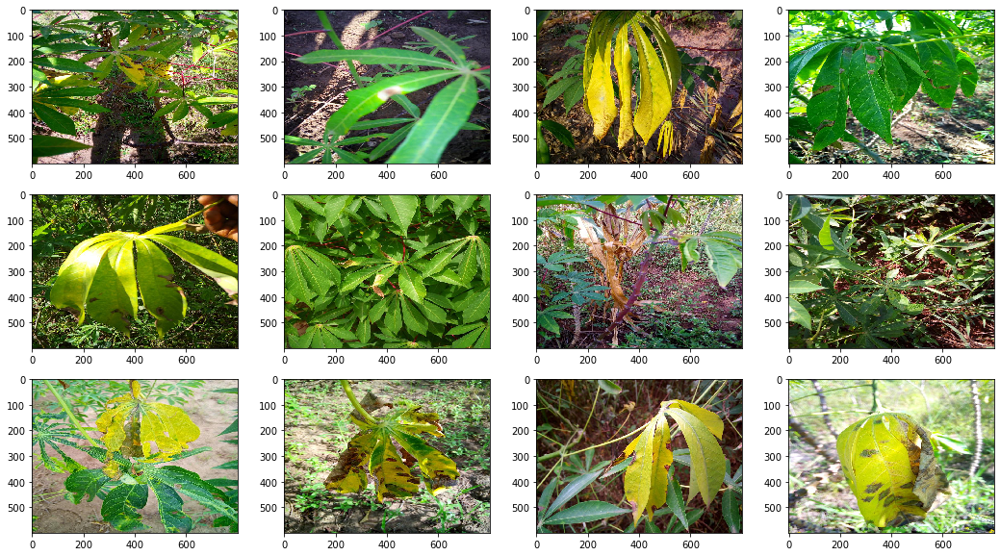

In [16]:
# class 0

n_rows = 3
n_cols = 4

figsize = [18, 10]
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize)

for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index+1)
        
        img = load_img(zero.iloc[index]['image_id'])
        
        plt.imshow(img, cmap='binary',interpolation='nearest')

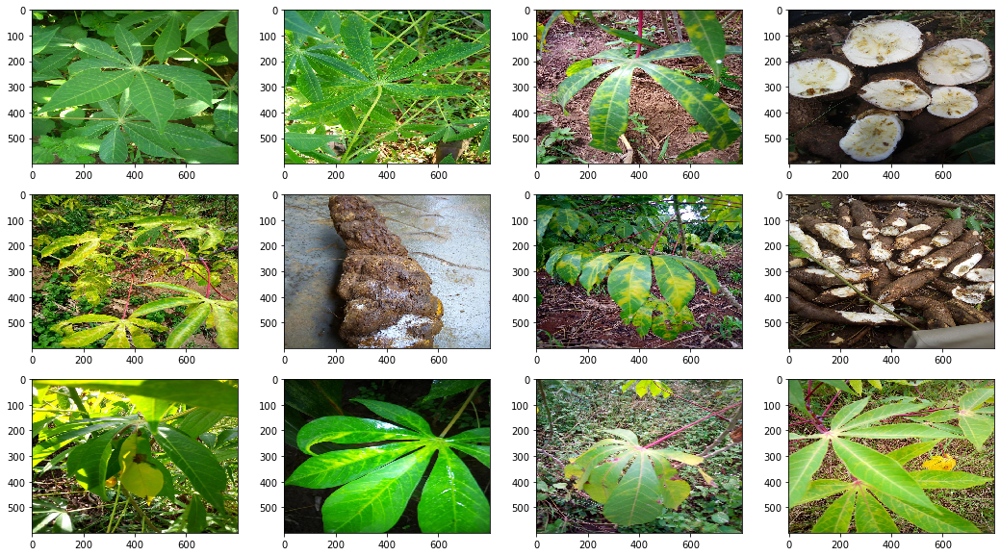

In [17]:
# class 1

n_rows = 3
n_cols = 4

figsize = [18, 10]
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize)

for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index+1)
        
        img = load_img(one.iloc[index]['image_id'])
        
        plt.imshow(img, cmap='binary',interpolation='nearest')

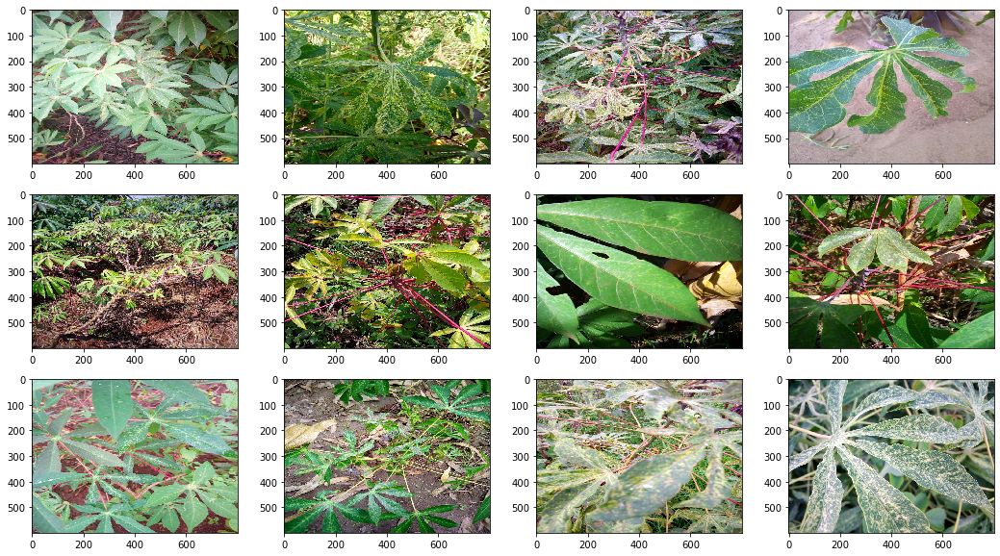

In [18]:
# class 2

n_rows = 3
n_cols = 4

figsize = [18, 10]
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize)

for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index+1)
        
        img = load_img(two.iloc[index]['image_id'])
        
        plt.imshow(img, cmap='binary',interpolation='nearest')

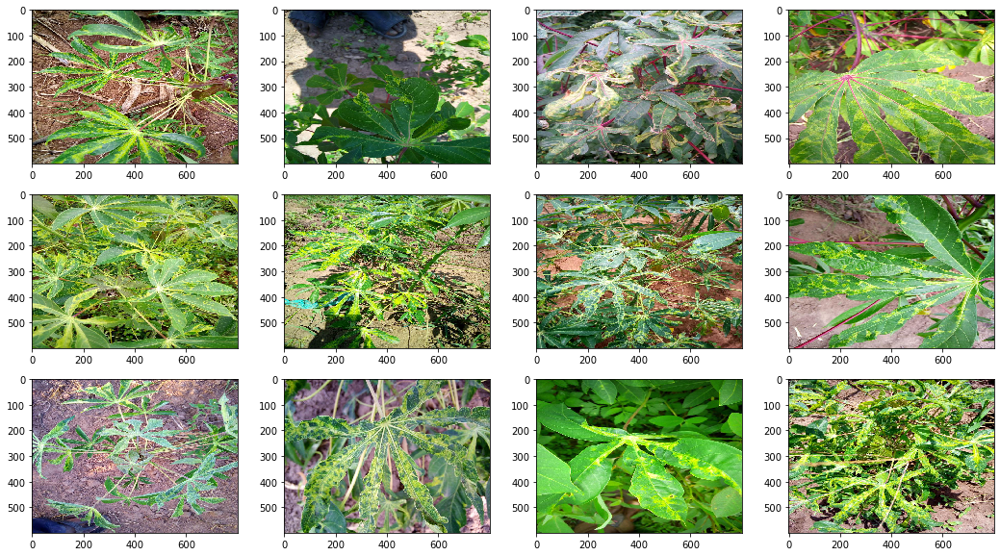

In [19]:
# class 3

n_rows = 3
n_cols = 4

figsize = [18, 10]
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize)

for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index+1)
        
        img = load_img(three.iloc[index]['image_id'])
        
        plt.imshow(img, cmap='binary',interpolation='nearest')

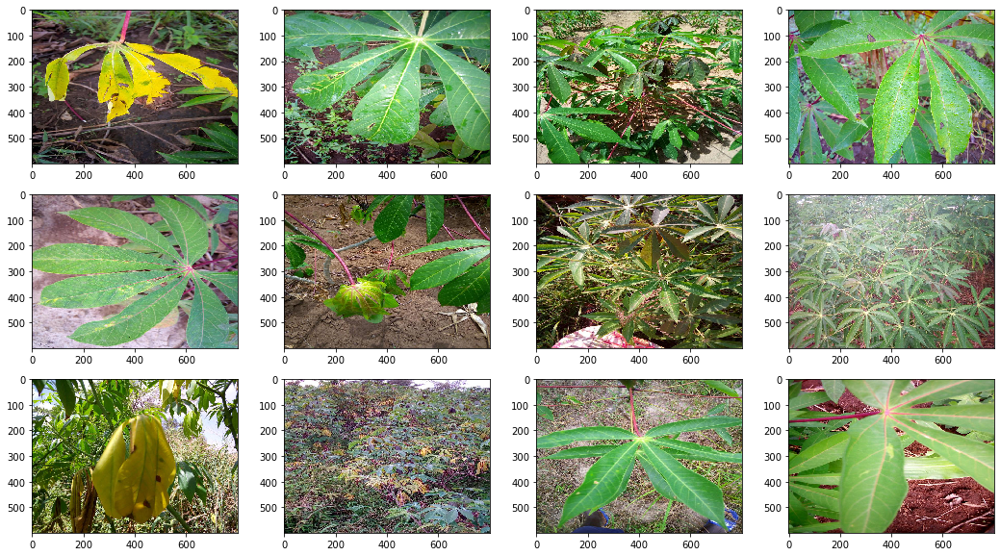

In [20]:
# class 4

n_rows = 3
n_cols = 4

figsize = [18, 10]
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize)

for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index+1)
        
        img = load_img(four.iloc[index]['image_id'])
        
        plt.imshow(img, cmap='binary',interpolation='nearest')

In [21]:
image_generator = ImageDataGenerator(rotation_range=15, horizontal_flip=True, vertical_flip=True,
                                     shear_range=0.2, zoom_range=0.2, brightness_range=[0.1,0.3], fill_mode='nearest', 
                                     validation_split=0.2, rescale = 1./255,
                                     preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

In [22]:
train_generator = image_generator.flow_from_dataframe(dataframe=train, directory=None, x_col='image_id', y_col='label',
                                                      subset='training', color_mode='rgb', batch_size=batch_size, seed=42,
                                                      shuffle=True, class_mode='categorical', target_size=(image_size,image_size))

Found 17118 validated image filenames belonging to 5 classes.


In [23]:
validation_generator = image_generator.flow_from_dataframe(dataframe=train, directory=None, x_col='image_id', y_col='label',
                                                   subset='validation', color_mode='rgb', batch_size=batch_size, seed=42,
                                                   shuffle=False, class_mode='categorical', target_size=(image_size,image_size))

Found 4279 validated image filenames belonging to 5 classes.


In [24]:
%reload_ext tensorboard

import datetime

In [25]:
def build_vgg_block(input_layer, num_cnn=3, channel=64, block_num=1):
    x = input_layer
    
    for cnn_num in range(num_cnn):
        x = keras.layers.Conv2D(
            filters=channel,
            kernel_size=(3,3),
            activation='relu',
            kernel_initializer='he_normal',
            padding='same',
            name=f'block{block_num}_conv{cnn_num}')(x)

    x = keras.layers.MaxPooling2D(
        pool_size=(2, 2),
        strides=2,
        name=f'block{block_num}_pooling')(x)

    return x

In [26]:
def build_vgg(input_shape=(image_size,image_size,3),
              num_cnn_list=[2,2,3,3,3],
              channel_list=[64,128,256,512,512],
              num_classes=5):
    input_layer = keras.layers.Input(shape=input_shape)
    output = input_layer
    
    for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
        output = build_vgg_block(
            output,
            num_cnn=num_cnn, 
            channel=channel,
            block_num=i
    )
        
    output = keras.layers.Flatten(name='flatten')(output)
    output = keras.layers.Dense(4096, activation='relu', kernel_regularizer='l2', name='fc1')(output)
    output = keras.layers.Dropout(0.5)(output)
    output = keras.layers.Dense(4096, activation='relu', kernel_regularizer='l2', name='fc2')(output)
    output = keras.layers.Dropout(0.5)(output)
    output = keras.layers.Dense(num_classes, activation='softmax', name='predictions')(output)
    
    model = keras.Model(
        inputs=input_layer, 
        outputs=output
    )
    return model

In [27]:
model = build_vgg()

Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/re

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localh

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/

In [28]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, clipnorm=1.),
    metrics=['accuracy']
)

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

In [29]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block0_conv0 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block0_conv1 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block0_pooling (MaxPooling2D (None, 112, 112, 64)      0         
_________________________________________________________________
block1_conv0 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block1_pooling (MaxPooling2D (None, 56, 56, 128)      

In [30]:
log_dir = "logs/cassava/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [31]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_checkpoint = ModelCheckpoint(save_model_filename, monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [32]:
from keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.00001)

In [33]:
epoch = 50

history = model.fit(
    train_generator,
    epochs=epoch,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[tensorboard_callback, early_stopping, model_checkpoint, reduce_lr]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteGraphSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSumm

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

 64/535 [==>...........................] - ETA: 3:44 - loss: 109.8646 - accuracy: 0.6011Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


108/535 [=====>........................] - ETA: 3:25 - loss: 106.5084 - accuracy: 0.6045Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


152/535 [=======>......................] - ETA: 3:05 - loss: 102.7589 - accuracy: 0.6049Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


196/535 [=========>....................] - ETA: 2:43 - loss: 98.4679 - accuracy: 0.6062Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


240/535 [============>.................] - ETA: 2:24 - loss: 93.9564 - accuracy: 0.6102Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


284/535 [==============>...............] - ETA: 2:02 - loss: 89.4134 - accuracy: 0.6123Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


328/535 [=================>............] - ETA: 1:40 - loss: 84.9243 - accuracy: 0.6127Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


372/535 [===================>..........] - ETA: 1:19 - loss: 80.5669 - accuracy: 0.6128Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


416/535 [======================>.......] - ETA: 57s - loss: 76.3847 - accuracy: 0.6116Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


460/535 [========================>.....] - ETA: 36s - loss: 72.3917 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


504/535 [===========================>..] - ETA: 15s - loss: 68.6236 - accuracy: 0.6134Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 66.1082 - accuracy: 0.6141Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Op

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 68/535 [==>...........................] - ETA: 3:00 - loss: 20.8944 - accuracy: 0.6095Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


112/535 [=====>........................] - ETA: 2:44 - loss: 19.2963 - accuracy: 0.6133Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


156/535 [=======>......................] - ETA: 2:27 - loss: 17.8847 - accuracy: 0.6092Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


200/535 [==========>...................] - ETA: 2:10 - loss: 16.6177 - accuracy: 0.6083Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


244/535 [============>.................] - ETA: 1:53 - loss: 15.4826 - accuracy: 0.6089Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


288/535 [===============>..............] - ETA: 1:36 - loss: 14.4645 - accuracy: 0.6093Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


332/535 [=================>............] - ETA: 1:19 - loss: 13.5458 - accuracy: 0.6118Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


376/535 [====================>.........] - ETA: 1:02 - loss: 12.7207 - accuracy: 0.6135Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


420/535 [======================>.......] - ETA: 45s - loss: 11.9799 - accuracy: 0.6133Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


464/535 [=========================>....] - ETA: 27s - loss: 11.3085 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


508/535 [===========================>..] - ETA: 10s - loss: 10.7052 - accuracy: 0.6122Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 10.3565 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 76/535 [===>..........................] - ETA: 3:00 - loss: 3.3732 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


120/535 [=====>........................] - ETA: 2:43 - loss: 3.2099 - accuracy: 0.6078Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


164/535 [========>.....................] - ETA: 2:26 - loss: 3.0423 - accuracy: 0.6147Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


208/535 [==========>...................] - ETA: 2:09 - loss: 2.8986 - accuracy: 0.6167Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


252/535 [=============>................] - ETA: 1:52 - loss: 2.7650 - accuracy: 0.6204Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


296/535 [===============>..............] - ETA: 1:34 - loss: 2.6517 - accuracy: 0.6210Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


340/535 [==================>...........] - ETA: 1:17 - loss: 2.5540 - accuracy: 0.6189Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


384/535 [====================>.........] - ETA: 1:00 - loss: 2.4668 - accuracy: 0.6169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


428/535 [=======================>......] - ETA: 42s - loss: 2.3839 - accuracy: 0.6174Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


472/535 [=========================>....] - ETA: 25s - loss: 2.3104 - accuracy: 0.6171Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


516/535 [===========================>..] - ETA: 7s - loss: 2.2482 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 2.2204 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 4/100
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/535 [=>............................] - ETA: 3:11 - loss: 1.4133 - accuracy: 0.6344Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/535 [===>..........................] - ETA: 2:58 - loss: 1.4181 - accuracy: 0.6220Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


128/535 [======>.......................] - ETA: 2:40 - loss: 1.4043 - accuracy: 0.6187Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


172/535 [========>.....................] - ETA: 2:22 - loss: 1.3883 - accuracy: 0.6185Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


216/535 [===========>..................] - ETA: 2:05 - loss: 1.3717 - accuracy: 0.6179Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


260/535 [=============>................] - ETA: 1:48 - loss: 1.3603 - accuracy: 0.6167Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


304/535 [================>.............] - ETA: 1:30 - loss: 1.3504 - accuracy: 0.6156Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


348/535 [==================>...........] - ETA: 1:13 - loss: 1.3374 - accuracy: 0.6167Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


392/535 [====================>.........] - ETA: 56s - loss: 1.3319 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


436/535 [=======================>......] - ETA: 38s - loss: 1.3225 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


480/535 [=========================>....] - ETA: 21s - loss: 1.3118 - accuracy: 0.6151Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


524/535 [============================>.] - ETA: 4s - loss: 1.3044 - accuracy: 0.6151Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.3038 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 47/535 [=>............................] - ETA: 3:08 - loss: 1.2098 - accuracy: 0.6210Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/535 [====>.........................] - ETA: 2:54 - loss: 1.2092 - accuracy: 0.6178Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


135/535 [======>.......................] - ETA: 2:37 - loss: 1.2104 - accuracy: 0.6149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


179/535 [=========>....................] - ETA: 2:20 - loss: 1.2077 - accuracy: 0.6161Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


223/535 [===========>..................] - ETA: 2:03 - loss: 1.2072 - accuracy: 0.6162Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


267/535 [=============>................] - ETA: 1:46 - loss: 1.2027 - accuracy: 0.6171Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


311/535 [================>.............] - ETA: 1:28 - loss: 1.2061 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


355/535 [==================>...........] - ETA: 1:11 - loss: 1.2044 - accuracy: 0.6145Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


399/535 [=====================>........] - ETA: 53s - loss: 1.2034 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


443/535 [=======================>......] - ETA: 36s - loss: 1.2009 - accuracy: 0.6149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


487/535 [==========================>...] - ETA: 19s - loss: 1.1998 - accuracy: 0.6149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


531/535 [============================>.] - ETA: 1s - loss: 1.2000 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1998 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 55/535 [==>...........................] - ETA: 3:04 - loss: 1.2262 - accuracy: 0.5943Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 99/535 [====>.........................] - ETA: 2:49 - loss: 1.2056 - accuracy: 0.6045Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


143/535 [=======>......................] - ETA: 2:32 - loss: 1.1906 - accuracy: 0.6123Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


187/535 [=========>....................] - ETA: 2:15 - loss: 1.1986 - accuracy: 0.6087Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


231/535 [===========>..................] - ETA: 1:58 - loss: 1.1946 - accuracy: 0.6114Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


275/535 [==============>...............] - ETA: 1:41 - loss: 1.1867 - accuracy: 0.6154Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


319/535 [================>.............] - ETA: 1:24 - loss: 1.1885 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


363/535 [===================>..........] - ETA: 1:07 - loss: 1.1892 - accuracy: 0.6141Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


407/535 [=====================>........] - ETA: 50s - loss: 1.1888 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


451/535 [========================>.....] - ETA: 32s - loss: 1.1890 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


495/535 [==========================>...] - ETA: 15s - loss: 1.1893 - accuracy: 0.6138Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1875 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in devic

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00006: val_loss improved from 1.18200 to 1.17802, saving model to cassava_vgg.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 63/535 [==>...........................] - ETA: 3:05 - loss: 1.2184 - accuracy: 0.5962Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


107/535 [=====>........................] - ETA: 2:49 - loss: 1.2168 - accuracy: 0.5973Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


151/535 [=======>......................] - ETA: 2:32 - loss: 1.1962 - accuracy: 0.6091Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


195/535 [=========>....................] - ETA: 2:14 - loss: 1.1905 - accuracy: 0.6123Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


239/535 [============>.................] - ETA: 1:57 - loss: 1.1900 - accuracy: 0.6128Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


283/535 [==============>...............] - ETA: 1:40 - loss: 1.1911 - accuracy: 0.6130Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


327/535 [=================>............] - ETA: 1:22 - loss: 1.1904 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


371/535 [===================>..........] - ETA: 1:05 - loss: 1.1900 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


415/535 [======================>.......] - ETA: 47s - loss: 1.1880 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


459/535 [========================>.....] - ETA: 30s - loss: 1.1849 - accuracy: 0.6155Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


503/535 [===========================>..] - ETA: 12s - loss: 1.1871 - accuracy: 0.6141Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1862 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 72/535 [===>..........................] - ETA: 3:02 - loss: 1.1925 - accuracy: 0.6095Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


116/535 [=====>........................] - ETA: 2:44 - loss: 1.1907 - accuracy: 0.6116Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


160/535 [=======>......................] - ETA: 2:27 - loss: 1.1933 - accuracy: 0.6100Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


204/535 [==========>...................] - ETA: 2:10 - loss: 1.1936 - accuracy: 0.6105Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


248/535 [============>.................] - ETA: 1:52 - loss: 1.1851 - accuracy: 0.6147Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


292/535 [===============>..............] - ETA: 1:35 - loss: 1.1834 - accuracy: 0.6157Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


336/535 [=================>............] - ETA: 1:18 - loss: 1.1884 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


380/535 [====================>.........] - ETA: 1:00 - loss: 1.1874 - accuracy: 0.6132Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


424/535 [======================>.......] - ETA: 43s - loss: 1.1869 - accuracy: 0.6134Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


468/535 [=========================>....] - ETA: 26s - loss: 1.1862 - accuracy: 0.6139Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


512/535 [===========================>..] - ETA: 9s - loss: 1.1862 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1860 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 51/535 [=>............................] - ETA: 3:07 - loss: 1.1825 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 95/535 [====>.........................] - ETA: 2:53 - loss: 1.1649 - accuracy: 0.6253Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


139/535 [======>.......................] - ETA: 2:36 - loss: 1.1689 - accuracy: 0.6228Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


183/535 [=========>....................] - ETA: 2:19 - loss: 1.1718 - accuracy: 0.6212Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


227/535 [===========>..................] - ETA: 2:02 - loss: 1.1817 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


271/535 [==============>...............] - ETA: 1:45 - loss: 1.1793 - accuracy: 0.6177Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


315/535 [================>.............] - ETA: 1:27 - loss: 1.1803 - accuracy: 0.6169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


359/535 [===================>..........] - ETA: 1:10 - loss: 1.1758 - accuracy: 0.6193Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


403/535 [=====================>........] - ETA: 52s - loss: 1.1816 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


447/535 [========================>.....] - ETA: 35s - loss: 1.1820 - accuracy: 0.6161Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


491/535 [==========================>...] - ETA: 17s - loss: 1.1835 - accuracy: 0.6153Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1859 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/repli

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 74/535 [===>..........................] - ETA: 3:00 - loss: 1.1838 - accuracy: 0.6149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


118/535 [=====>........................] - ETA: 2:44 - loss: 1.1818 - accuracy: 0.6173Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


162/535 [========>.....................] - ETA: 2:27 - loss: 1.1877 - accuracy: 0.6138Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


206/535 [==========>...................] - ETA: 2:11 - loss: 1.1903 - accuracy: 0.6115Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


250/535 [=============>................] - ETA: 1:53 - loss: 1.1889 - accuracy: 0.6130Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


294/535 [===============>..............] - ETA: 1:35 - loss: 1.1877 - accuracy: 0.6138Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


338/535 [=================>............] - ETA: 1:18 - loss: 1.1843 - accuracy: 0.6157Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


382/535 [====================>.........] - ETA: 1:00 - loss: 1.1834 - accuracy: 0.6167Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


426/535 [======================>.......] - ETA: 43s - loss: 1.1841 - accuracy: 0.6159Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


470/535 [=========================>....] - ETA: 25s - loss: 1.1834 - accuracy: 0.6159Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


514/535 [===========================>..] - ETA: 8s - loss: 1.1845 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1863 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 52/535 [=>............................] - ETA: 3:05 - loss: 1.2411 - accuracy: 0.5871Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/535 [====>.........................] - ETA: 2:50 - loss: 1.2187 - accuracy: 0.5987Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


140/535 [======>.......................] - ETA: 2:33 - loss: 1.2011 - accuracy: 0.6072Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


184/535 [=========>....................] - ETA: 2:17 - loss: 1.1955 - accuracy: 0.6099Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


228/535 [===========>..................] - ETA: 2:00 - loss: 1.1902 - accuracy: 0.6124Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


272/535 [==============>...............] - ETA: 1:43 - loss: 1.1837 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


316/535 [================>.............] - ETA: 1:26 - loss: 1.1819 - accuracy: 0.6171Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


360/535 [===================>..........] - ETA: 1:08 - loss: 1.1833 - accuracy: 0.6162Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


404/535 [=====================>........] - ETA: 51s - loss: 1.1811 - accuracy: 0.6175Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


448/535 [========================>.....] - ETA: 34s - loss: 1.1840 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


492/535 [==========================>...] - ETA: 16s - loss: 1.1839 - accuracy: 0.6158Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1857 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 i

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 75/535 [===>..........................] - ETA: 3:00 - loss: 1.1876 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


119/535 [=====>........................] - ETA: 2:44 - loss: 1.1853 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


163/535 [========>.....................] - ETA: 2:26 - loss: 1.1804 - accuracy: 0.6158Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


207/535 [==========>...................] - ETA: 2:09 - loss: 1.1872 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


251/535 [=============>................] - ETA: 1:52 - loss: 1.1892 - accuracy: 0.6118Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


295/535 [===============>..............] - ETA: 1:35 - loss: 1.1916 - accuracy: 0.6106Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


339/535 [==================>...........] - ETA: 1:17 - loss: 1.1913 - accuracy: 0.6114Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


383/535 [====================>.........] - ETA: 1:00 - loss: 1.1899 - accuracy: 0.6118Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


427/535 [======================>.......] - ETA: 42s - loss: 1.1916 - accuracy: 0.6113Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


471/535 [=========================>....] - ETA: 25s - loss: 1.1896 - accuracy: 0.6123Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


515/535 [===========================>..] - ETA: 7s - loss: 1.1874 - accuracy: 0.6138Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1861 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 52/535 [=>............................] - ETA: 3:05 - loss: 1.1441 - accuracy: 0.6376Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/535 [====>.........................] - ETA: 2:50 - loss: 1.1729 - accuracy: 0.6217Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


140/535 [======>.......................] - ETA: 2:33 - loss: 1.1903 - accuracy: 0.6129Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


184/535 [=========>....................] - ETA: 2:16 - loss: 1.1956 - accuracy: 0.6092Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


228/535 [===========>..................] - ETA: 2:00 - loss: 1.1824 - accuracy: 0.6162Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


272/535 [==============>...............] - ETA: 1:43 - loss: 1.1875 - accuracy: 0.6129Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


316/535 [================>.............] - ETA: 1:25 - loss: 1.1881 - accuracy: 0.6133Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


360/535 [===================>..........] - ETA: 1:08 - loss: 1.1902 - accuracy: 0.6122Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


404/535 [=====================>........] - ETA: 51s - loss: 1.1904 - accuracy: 0.6115Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


448/535 [========================>.....] - ETA: 34s - loss: 1.1870 - accuracy: 0.6136Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


492/535 [==========================>...] - ETA: 16s - loss: 1.1853 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1854 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 i

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 75/535 [===>..........................] - ETA: 3:00 - loss: 1.1833 - accuracy: 0.6183Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


119/535 [=====>........................] - ETA: 2:44 - loss: 1.1858 - accuracy: 0.6169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


163/535 [========>.....................] - ETA: 2:27 - loss: 1.1820 - accuracy: 0.6181Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


207/535 [==========>...................] - ETA: 2:10 - loss: 1.1790 - accuracy: 0.6193Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


251/535 [=============>................] - ETA: 1:52 - loss: 1.1820 - accuracy: 0.6173Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


295/535 [===============>..............] - ETA: 1:35 - loss: 1.1812 - accuracy: 0.6177Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


339/535 [==================>...........] - ETA: 1:17 - loss: 1.1848 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


383/535 [====================>.........] - ETA: 1:00 - loss: 1.1863 - accuracy: 0.6139Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


427/535 [======================>.......] - ETA: 43s - loss: 1.1839 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


471/535 [=========================>....] - ETA: 25s - loss: 1.1863 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


515/535 [===========================>..] - ETA: 7s - loss: 1.1843 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1852 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 15/100
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/535 [=>............................] - ETA: 3:09 - loss: 1.1587 - accuracy: 0.6274Executing op __inference_train_function_2846

 83/535 [===>..........................] - ETA: 2:55 - loss: 1.1604 - accuracy: 0.6280Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


127/535 [======>.......................] - ETA: 2:38 - loss: 1.1521 - accuracy: 0.6329Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


171/535 [========>.....................] - ETA: 2:22 - loss: 1.1604 - accuracy: 0.6283Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


215/535 [===========>..................] - ETA: 2:05 - loss: 1.1675 - accuracy: 0.6247Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


259/535 [=============>................] - ETA: 1:47 - loss: 1.1754 - accuracy: 0.6203Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


303/535 [===============>..............] - ETA: 1:30 - loss: 1.1755 - accuracy: 0.6202Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


347/535 [==================>...........] - ETA: 1:13 - loss: 1.1813 - accuracy: 0.6170Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


391/535 [====================>.........] - ETA: 56s - loss: 1.1810 - accuracy: 0.6169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


435/535 [=======================>......] - ETA: 39s - loss: 1.1830 - accuracy: 0.6157Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


479/535 [=========================>....] - ETA: 21s - loss: 1.1857 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


523/535 [============================>.] - ETA: 4s - loss: 1.1832 - accuracy: 0.6153Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1850 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Ex

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 61/535 [==>...........................] - ETA: 3:05 - loss: 1.1844 - accuracy: 0.6183Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


105/535 [====>.........................] - ETA: 2:49 - loss: 1.1974 - accuracy: 0.6107Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


149/535 [=======>......................] - ETA: 2:33 - loss: 1.1905 - accuracy: 0.6141Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


193/535 [=========>....................] - ETA: 2:15 - loss: 1.1938 - accuracy: 0.6108Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


237/535 [============>.................] - ETA: 1:58 - loss: 1.1870 - accuracy: 0.6147Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


281/535 [==============>...............] - ETA: 1:40 - loss: 1.1811 - accuracy: 0.6174Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


325/535 [=================>............] - ETA: 1:23 - loss: 1.1825 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


369/535 [===================>..........] - ETA: 1:05 - loss: 1.1812 - accuracy: 0.6170Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


413/535 [======================>.......] - ETA: 48s - loss: 1.1853 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


457/535 [========================>.....] - ETA: 30s - loss: 1.1853 - accuracy: 0.6148Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


501/535 [===========================>..] - ETA: 13s - loss: 1.1858 - accuracy: 0.6146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1852 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 69/535 [==>...........................] - ETA: 3:00 - loss: 1.2152 - accuracy: 0.5970Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


113/535 [=====>........................] - ETA: 2:44 - loss: 1.1936 - accuracy: 0.6099Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


157/535 [=======>......................] - ETA: 2:27 - loss: 1.1890 - accuracy: 0.6119Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


201/535 [==========>...................] - ETA: 2:10 - loss: 1.1760 - accuracy: 0.6188Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


245/535 [============>.................] - ETA: 1:53 - loss: 1.1796 - accuracy: 0.6172Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


289/535 [===============>..............] - ETA: 1:36 - loss: 1.1744 - accuracy: 0.6198Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


333/535 [=================>............] - ETA: 1:19 - loss: 1.1743 - accuracy: 0.6197Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


377/535 [====================>.........] - ETA: 1:01 - loss: 1.1759 - accuracy: 0.6191Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


421/535 [======================>.......] - ETA: 44s - loss: 1.1844 - accuracy: 0.6146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


465/535 [=========================>....] - ETA: 27s - loss: 1.1863 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


509/535 [===========================>..] - ETA: 10s - loss: 1.1866 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1851 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 46/535 [=>............................] - ETA: 3:11 - loss: 1.1562 - accuracy: 0.6284Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 90/535 [====>.........................] - ETA: 2:55 - loss: 1.1540 - accuracy: 0.6313Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


134/535 [======>.......................] - ETA: 2:38 - loss: 1.1718 - accuracy: 0.6217Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


178/535 [========>.....................] - ETA: 2:21 - loss: 1.1738 - accuracy: 0.6206Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


222/535 [===========>..................] - ETA: 2:04 - loss: 1.1712 - accuracy: 0.6222Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


266/535 [=============>................] - ETA: 1:47 - loss: 1.1788 - accuracy: 0.6184Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


310/535 [================>.............] - ETA: 1:29 - loss: 1.1819 - accuracy: 0.6168Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


354/535 [==================>...........] - ETA: 1:12 - loss: 1.1801 - accuracy: 0.6177Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


398/535 [=====================>........] - ETA: 54s - loss: 1.1819 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


442/535 [=======================>......] - ETA: 37s - loss: 1.1819 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


486/535 [==========================>...] - ETA: 19s - loss: 1.1830 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


530/535 [============================>.] - ETA: 1s - loss: 1.1854 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1851 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 54/535 [==>...........................] - ETA: 3:12 - loss: 1.1730 - accuracy: 0.6204Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/535 [====>.........................] - ETA: 2:53 - loss: 1.1694 - accuracy: 0.6237Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


142/535 [======>.......................] - ETA: 2:35 - loss: 1.1814 - accuracy: 0.6164Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


186/535 [=========>....................] - ETA: 2:18 - loss: 1.1782 - accuracy: 0.6191Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


230/535 [===========>..................] - ETA: 2:00 - loss: 1.1785 - accuracy: 0.6182Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


274/535 [==============>...............] - ETA: 1:43 - loss: 1.1723 - accuracy: 0.6218Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


318/535 [================>.............] - ETA: 1:25 - loss: 1.1772 - accuracy: 0.6189Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


362/535 [===================>..........] - ETA: 1:08 - loss: 1.1751 - accuracy: 0.6199Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


406/535 [=====================>........] - ETA: 50s - loss: 1.1805 - accuracy: 0.6171Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


450/535 [========================>.....] - ETA: 33s - loss: 1.1821 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


494/535 [==========================>...] - ETA: 16s - loss: 1.1842 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/tas

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00019: val_loss improved from 1.17754 to 1.17754, saving model to cassa

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 62/535 [==>...........................] - ETA: 3:05 - loss: 1.2043 - accuracy: 0.6033Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


106/535 [====>.........................] - ETA: 2:50 - loss: 1.1775 - accuracy: 0.6176Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


150/535 [=======>......................] - ETA: 2:32 - loss: 1.1775 - accuracy: 0.6181Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


194/535 [=========>....................] - ETA: 2:15 - loss: 1.1899 - accuracy: 0.6108Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


238/535 [============>.................] - ETA: 1:58 - loss: 1.1869 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


282/535 [==============>...............] - ETA: 1:40 - loss: 1.1880 - accuracy: 0.6124Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


326/535 [=================>............] - ETA: 1:23 - loss: 1.1890 - accuracy: 0.6123Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


370/535 [===================>..........] - ETA: 1:05 - loss: 1.1837 - accuracy: 0.6155Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


414/535 [======================>.......] - ETA: 48s - loss: 1.1842 - accuracy: 0.6153Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


458/535 [========================>.....] - ETA: 30s - loss: 1.1858 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


502/535 [===========================>..] - ETA: 13s - loss: 1.1857 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 70/535 [==>...........................] - ETA: 3:03 - loss: 1.2120 - accuracy: 0.5987Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


114/535 [=====>........................] - ETA: 2:47 - loss: 1.1878 - accuracy: 0.6113Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


158/535 [=======>......................] - ETA: 2:29 - loss: 1.1966 - accuracy: 0.6074Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


202/535 [==========>...................] - ETA: 2:12 - loss: 1.1989 - accuracy: 0.6057Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


246/535 [============>.................] - ETA: 1:54 - loss: 1.1977 - accuracy: 0.6067Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


290/535 [===============>..............] - ETA: 1:37 - loss: 1.1930 - accuracy: 0.6092Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


334/535 [=================>............] - ETA: 1:19 - loss: 1.1884 - accuracy: 0.6121Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


378/535 [====================>.........] - ETA: 1:02 - loss: 1.1865 - accuracy: 0.6132Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


422/535 [======================>.......] - ETA: 44s - loss: 1.1854 - accuracy: 0.6141Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


466/535 [=========================>....] - ETA: 27s - loss: 1.1867 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


510/535 [===========================>..] - ETA: 9s - loss: 1.1862 - accuracy: 0.6140 Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1848 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
535/535 [==============================] - 271s 506ms/step - loss: 1.1848 - accuracy: 0.6146 - val_loss: 1.1775 - val_accur

 78/535 [===>..........................] - ETA: 2:56 - loss: 1.1817 - accuracy: 0.6170Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


122/535 [=====>........................] - ETA: 2:40 - loss: 1.1834 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


166/535 [========>.....................] - ETA: 2:24 - loss: 1.1905 - accuracy: 0.6124Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


210/535 [==========>...................] - ETA: 2:07 - loss: 1.1969 - accuracy: 0.6082Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


254/535 [=============>................] - ETA: 1:50 - loss: 1.1942 - accuracy: 0.6091Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


298/535 [===============>..............] - ETA: 1:33 - loss: 1.1892 - accuracy: 0.6116Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


342/535 [==================>...........] - ETA: 1:16 - loss: 1.1814 - accuracy: 0.6162Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


386/535 [====================>.........] - ETA: 58s - loss: 1.1804 - accuracy: 0.6166Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


430/535 [=======================>......] - ETA: 41s - loss: 1.1837 - accuracy: 0.6148Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


474/535 [=========================>....] - ETA: 24s - loss: 1.1841 - accuracy: 0.6147Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


518/535 [============================>.] - ETA: 6s - loss: 1.1850 - accuracy: 0.6146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1850 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 23/100
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/535 [=>............................] - ETA: 3:12 - loss: 1.1713 - accuracy: 0.6228Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/535 [===>..........................] - ETA: 2:56 - loss: 1.1590 - accuracy: 0.6283Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


130/535 [======>.......................] - ETA: 2:39 - loss: 1.1651 - accuracy: 0.6252Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


174/535 [========>.....................] - ETA: 2:22 - loss: 1.1773 - accuracy: 0.6191Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


218/535 [===========>..................] - ETA: 2:05 - loss: 1.1803 - accuracy: 0.6173Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


262/535 [=============>................] - ETA: 1:48 - loss: 1.1774 - accuracy: 0.6189Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


306/535 [================>.............] - ETA: 1:31 - loss: 1.1816 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


350/535 [==================>...........] - ETA: 1:13 - loss: 1.1809 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


394/535 [=====================>........] - ETA: 55s - loss: 1.1809 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


438/535 [=======================>......] - ETA: 38s - loss: 1.1834 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


482/535 [==========================>...] - ETA: 20s - loss: 1.1827 - accuracy: 0.6154Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


526/535 [============================>.] - ETA: 3s - loss: 1.1834 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1845 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op W

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 48/535 [=>............................] - ETA: 3:06 - loss: 1.1869 - accuracy: 0.6146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/535 [====>.........................] - ETA: 2:52 - loss: 1.1964 - accuracy: 0.6077Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


136/535 [======>.......................] - ETA: 2:35 - loss: 1.1804 - accuracy: 0.6179Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


180/535 [=========>....................] - ETA: 2:18 - loss: 1.1824 - accuracy: 0.6169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


224/535 [===========>..................] - ETA: 2:01 - loss: 1.1783 - accuracy: 0.6188Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


268/535 [==============>...............] - ETA: 1:44 - loss: 1.1766 - accuracy: 0.6201Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


312/535 [================>.............] - ETA: 1:27 - loss: 1.1763 - accuracy: 0.6194Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


356/535 [==================>...........] - ETA: 1:10 - loss: 1.1766 - accuracy: 0.6196Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


400/535 [=====================>........] - ETA: 53s - loss: 1.1819 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


444/535 [=======================>......] - ETA: 35s - loss: 1.1812 - accuracy: 0.6168Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


488/535 [==========================>...] - ETA: 18s - loss: 1.1856 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


532/535 [============================>.] - ETA: 1s - loss: 1.1852 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 70/535 [==>...........................] - ETA: 3:01 - loss: 1.1899 - accuracy: 0.6126Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


114/535 [=====>........................] - ETA: 2:45 - loss: 1.1913 - accuracy: 0.6116Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


158/535 [=======>......................] - ETA: 2:29 - loss: 1.1890 - accuracy: 0.6128Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


202/535 [==========>...................] - ETA: 2:11 - loss: 1.1831 - accuracy: 0.6159Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


246/535 [============>.................] - ETA: 1:54 - loss: 1.1840 - accuracy: 0.6158Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


290/535 [===============>..............] - ETA: 1:37 - loss: 1.1774 - accuracy: 0.6194Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


334/535 [=================>............] - ETA: 1:19 - loss: 1.1798 - accuracy: 0.6180Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


378/535 [====================>.........] - ETA: 1:02 - loss: 1.1779 - accuracy: 0.6187Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


422/535 [======================>.......] - ETA: 44s - loss: 1.1812 - accuracy: 0.6165Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


466/535 [=========================>....] - ETA: 27s - loss: 1.1849 - accuracy: 0.6146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


510/535 [===========================>..] - ETA: 9s - loss: 1.1846 - accuracy: 0.6148 Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 48/535 [=>............................] - ETA: 3:10 - loss: 1.1906 - accuracy: 0.6113Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/535 [====>.........................] - ETA: 2:54 - loss: 1.1694 - accuracy: 0.6217Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


136/535 [======>.......................] - ETA: 2:38 - loss: 1.1597 - accuracy: 0.6290Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


180/535 [=========>....................] - ETA: 2:20 - loss: 1.1602 - accuracy: 0.6278Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


224/535 [===========>..................] - ETA: 2:03 - loss: 1.1653 - accuracy: 0.6257Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


268/535 [==============>...............] - ETA: 1:46 - loss: 1.1687 - accuracy: 0.6240Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


312/535 [================>.............] - ETA: 1:28 - loss: 1.1734 - accuracy: 0.6212Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


356/535 [==================>...........] - ETA: 1:11 - loss: 1.1748 - accuracy: 0.6202Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


400/535 [=====================>........] - ETA: 53s - loss: 1.1742 - accuracy: 0.6205Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


444/535 [=======================>......] - ETA: 36s - loss: 1.1793 - accuracy: 0.6176Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


488/535 [==========================>...] - ETA: 18s - loss: 1.1814 - accuracy: 0.6164Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


532/535 [============================>.] - ETA: 1s - loss: 1.1848 - accuracy: 0.6147Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 70/535 [==>...........................] - ETA: 3:03 - loss: 1.1884 - accuracy: 0.6152Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


114/535 [=====>........................] - ETA: 2:46 - loss: 1.1860 - accuracy: 0.6154Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


158/535 [=======>......................] - ETA: 2:29 - loss: 1.1770 - accuracy: 0.6197Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


202/535 [==========>...................] - ETA: 2:12 - loss: 1.1813 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


246/535 [============>.................] - ETA: 1:54 - loss: 1.1856 - accuracy: 0.6139Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


290/535 [===============>..............] - ETA: 1:37 - loss: 1.1810 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


334/535 [=================>............] - ETA: 1:19 - loss: 1.1818 - accuracy: 0.6159Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


378/535 [====================>.........] - ETA: 1:02 - loss: 1.1821 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


422/535 [======================>.......] - ETA: 44s - loss: 1.1854 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


466/535 [=========================>....] - ETA: 27s - loss: 1.1839 - accuracy: 0.6151Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


510/535 [===========================>..] - ETA: 9s - loss: 1.1844 - accuracy: 0.6149 Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 48/535 [=>............................] - ETA: 3:07 - loss: 1.1528 - accuracy: 0.6317Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 92/535 [====>.........................] - ETA: 2:52 - loss: 1.1769 - accuracy: 0.6196Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


136/535 [======>.......................] - ETA: 2:35 - loss: 1.1864 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


180/535 [=========>....................] - ETA: 2:19 - loss: 1.1848 - accuracy: 0.6157Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


224/535 [===========>..................] - ETA: 2:01 - loss: 1.1863 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


268/535 [==============>...............] - ETA: 1:44 - loss: 1.1873 - accuracy: 0.6138Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


312/535 [================>.............] - ETA: 1:27 - loss: 1.1852 - accuracy: 0.6151Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


356/535 [==================>...........] - ETA: 1:10 - loss: 1.1846 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


400/535 [=====================>........] - ETA: 53s - loss: 1.1830 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


444/535 [=======================>......] - ETA: 35s - loss: 1.1836 - accuracy: 0.6157Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


488/535 [==========================>...] - ETA: 18s - loss: 1.1857 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


532/535 [============================>.] - ETA: 1s - loss: 1.1851 - accuracy: 0.6146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1850 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 70/535 [==>...........................] - ETA: 3:06 - loss: 1.1879 - accuracy: 0.6103Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


114/535 [=====>........................] - ETA: 2:48 - loss: 1.1881 - accuracy: 0.6121Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


158/535 [=======>......................] - ETA: 2:31 - loss: 1.1938 - accuracy: 0.6096Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


202/535 [==========>...................] - ETA: 2:13 - loss: 1.1892 - accuracy: 0.6117Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


246/535 [============>.................] - ETA: 1:55 - loss: 1.1930 - accuracy: 0.6104Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


290/535 [===============>..............] - ETA: 1:38 - loss: 1.1924 - accuracy: 0.6104Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


334/535 [=================>............] - ETA: 1:20 - loss: 1.1926 - accuracy: 0.6107Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


378/535 [====================>.........] - ETA: 1:02 - loss: 1.1909 - accuracy: 0.6120Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


422/535 [======================>.......] - ETA: 45s - loss: 1.1937 - accuracy: 0.6100Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


466/535 [=========================>....] - ETA: 27s - loss: 1.1904 - accuracy: 0.6117Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


510/535 [===========================>..] - ETA: 10s - loss: 1.1858 - accuracy: 0.6140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 47/535 [=>............................] - ETA: 3:08 - loss: 1.2008 - accuracy: 0.6064Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/535 [====>.........................] - ETA: 2:52 - loss: 1.1867 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


135/535 [======>.......................] - ETA: 2:36 - loss: 1.1823 - accuracy: 0.6169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


179/535 [=========>....................] - ETA: 2:19 - loss: 1.1743 - accuracy: 0.6205Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


223/535 [===========>..................] - ETA: 2:02 - loss: 1.1846 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


267/535 [=============>................] - ETA: 1:45 - loss: 1.1891 - accuracy: 0.6116Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


311/535 [================>.............] - ETA: 1:27 - loss: 1.1869 - accuracy: 0.6130Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


355/535 [==================>...........] - ETA: 1:10 - loss: 1.1851 - accuracy: 0.6143Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


399/535 [=====================>........] - ETA: 53s - loss: 1.1828 - accuracy: 0.6153Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


443/535 [=======================>......] - ETA: 36s - loss: 1.1820 - accuracy: 0.6158Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


487/535 [==========================>...] - ETA: 18s - loss: 1.1843 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


531/535 [============================>.] - ETA: 1s - loss: 1.1856 - accuracy: 0.6141Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1849 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 68/535 [==>...........................] - ETA: 3:03 - loss: 1.1900 - accuracy: 0.6158Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


112/535 [=====>........................] - ETA: 2:47 - loss: 1.1919 - accuracy: 0.6142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


156/535 [=======>......................] - ETA: 2:30 - loss: 1.1812 - accuracy: 0.6190Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


200/535 [==========>...................] - ETA: 2:12 - loss: 1.1781 - accuracy: 0.6197Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


244/535 [============>.................] - ETA: 1:55 - loss: 1.1834 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


288/535 [===============>..............] - ETA: 1:38 - loss: 1.1826 - accuracy: 0.6163Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


332/535 [=================>............] - ETA: 1:20 - loss: 1.1831 - accuracy: 0.6156Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


376/535 [====================>.........] - ETA: 1:03 - loss: 1.1854 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


420/535 [======================>.......] - ETA: 45s - loss: 1.1864 - accuracy: 0.6133Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


464/535 [=========================>....] - ETA: 28s - loss: 1.1865 - accuracy: 0.6137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


508/535 [===========================>..] - ETA: 10s - loss: 1.1859 - accuracy: 0.6139Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1850 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 45/535 [=>............................] - ETA: 3:12 - loss: 1.1425 - accuracy: 0.6354Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


 89/535 [===>..........................] - ETA: 2:56 - loss: 1.1822 - accuracy: 0.6166Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


133/535 [======>.......................] - ETA: 2:40 - loss: 1.1805 - accuracy: 0.6182Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


177/535 [========>.....................] - ETA: 2:22 - loss: 1.1854 - accuracy: 0.6149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


221/535 [===========>..................] - ETA: 2:04 - loss: 1.1849 - accuracy: 0.6160Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


265/535 [=============>................] - ETA: 1:47 - loss: 1.1741 - accuracy: 0.6212Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


309/535 [================>.............] - ETA: 1:29 - loss: 1.1795 - accuracy: 0.6187Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


353/535 [==================>...........] - ETA: 1:12 - loss: 1.1841 - accuracy: 0.6156Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


397/535 [=====================>........] - ETA: 54s - loss: 1.1843 - accuracy: 0.6149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


441/535 [=======================>......] - ETA: 37s - loss: 1.1866 - accuracy: 0.6133Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


485/535 [==========================>...] - ETA: 19s - loss: 1.1839 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


529/535 [============================>.] - ETA: 2s - loss: 1.1844 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1851 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 66/535 [==>...........................] - ETA: 3:01 - loss: 1.1982 - accuracy: 0.6061Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


110/535 [=====>........................] - ETA: 2:46 - loss: 1.1882 - accuracy: 0.6119Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


154/535 [=======>......................] - ETA: 2:29 - loss: 1.1887 - accuracy: 0.6114Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


198/535 [==========>...................] - ETA: 2:13 - loss: 1.1952 - accuracy: 0.6083Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


242/535 [============>.................] - ETA: 1:55 - loss: 1.1951 - accuracy: 0.6082Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


286/535 [===============>..............] - ETA: 1:38 - loss: 1.1868 - accuracy: 0.6131Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


330/535 [=================>............] - ETA: 1:21 - loss: 1.1854 - accuracy: 0.6145Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


374/535 [===================>..........] - ETA: 1:03 - loss: 1.1842 - accuracy: 0.6150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


418/535 [======================>.......] - ETA: 46s - loss: 1.1835 - accuracy: 0.6153Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


462/535 [========================>.....] - ETA: 29s - loss: 1.1831 - accuracy: 0.6155Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


506/535 [===========================>..] - ETA: 11s - loss: 1.1852 - accuracy: 0.6144Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.1847 - accuracy: 0.6146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [34]:
%tensorboard --logdir logs/cassava

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 16732.

train loss: 1.1846859455108643
train accuracy: 0.6145578026771545
dev loss: 1.1775200366973877
dev accuracy: 0.6164991855621338
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0


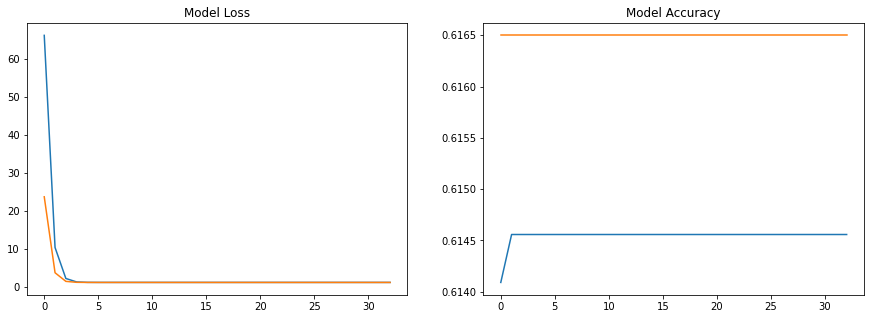

In [35]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_accuracy'][-1])

results = pd.DataFrame(history.history)

fig, axs = plt.subplots(1,2,figsize=(15,5))

axs[0].plot(results[['loss', 'val_loss']])
axs[0].set_title('Model Loss')

axs[1].plot(results[['accuracy', 'val_accuracy']])
axs[1].set_title('Model Accuracy')

plt.show()

In [36]:
test = pd.read_csv('./cassava-leaf-disease-classification/sample_submission.csv')

test_path = './cassava-leaf-disease-classification/test_images'
def test_image_path(image):
    return os.path.join(test_path,image)

test['image_id'] = test['image_id'].apply(test_image_path)

test['label'] = test['label'].astype('str')

In [37]:
test.head()

,image_id,label
0,./cassava-leaf-disease-classification/test_ima...,4


In [38]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(dataframe=test, directory=None, x_col='image_id', y_col='label',
                                              preprocessing_function=applications.vgg16.preprocess_input,
                                              class_mode='categorical', target_size=(image_size,image_size))

Found 1 validated image filenames belonging to 1 classes.


In [39]:
output = model.predict_generator(test_generator)

Instructions for updating:
Please use Model.predict, which supports generators.
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [40]:
submission = pd.DataFrame()
submission['image_id'] = list(os.listdir('./cassava-leaf-disease-classification/test_images/'))
submission['label'] = np.argmax(output, axis=1)

In [41]:
submission.to_csv("submission.csv", index=False)

In [42]:
submission.head()

,image_id,label
0,2216849948.jpg,3


In [43]:
model.save(save_model_filename)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

In [68]:
pred = model.predict(validation_generator)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_59797 in device /job:localhost/

In [69]:
print(pred)

[[0.05197951 0.1025321  0.11072289 0.61403644 0.12072897]
 [0.05197952 0.1025321  0.11072291 0.61403644 0.12072897]
 [0.05197952 0.1025321  0.11072291 0.61403644 0.12072897]
 ...
 [0.05197951 0.1025321  0.1107229  0.6140365  0.12072895]
 [0.05197951 0.1025321  0.1107229  0.6140365  0.12072895]
 [0.05197951 0.1025321  0.11072289 0.61403644 0.12072897]]


In [84]:
predictions = np.argmax(pred, axis=1)

In [85]:
predictions

array([3, 3, 3, ..., 3, 3, 3], dtype=int64)

In [86]:
actual = validation_generator.classes

In [87]:
actual

[0,
 3,
 1,
 1,
 3,
 3,
 2,
 0,
 4,
 3,
 3,
 3,
 1,
 3,
 3,
 2,
 3,
 4,
 0,
 3,
 3,
 3,
 1,
 3,
 2,
 2,
 3,
 3,
 2,
 2,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 1,
 1,
 3,
 3,
 3,
 3,
 4,
 1,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 1,
 3,
 4,
 3,
 3,
 3,
 3,
 4,
 2,
 3,
 4,
 4,
 1,
 0,
 1,
 3,
 1,
 3,
 1,
 4,
 3,
 3,
 3,
 4,
 2,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 2,
 1,
 3,
 3,
 1,
 1,
 2,
 3,
 2,
 4,
 2,
 2,
 4,
 3,
 3,
 1,
 3,
 0,
 3,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 0,
 3,
 3,
 1,
 2,
 0,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 4,
 3,
 3,
 4,
 0,
 3,
 2,
 3,
 1,
 0,
 3,
 3,
 3,
 2,
 3,
 2,
 3,
 3,
 3,
 2,
 0,
 3,
 1,
 3,
 3,
 3,
 0,
 3,
 3,
 4,
 3,
 3,
 1,
 2,
 3,
 3,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 2,
 1,
 3,
 0,
 1,
 4,
 4,
 3,
 3,
 3,
 2,
 3,
 1,
 4,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 0,
 1,
 3,
 1,
 3,
 3,
 1,
 3,
 3,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 0,
 1,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 2,
 4,
 3,
 3,
 3,
 2,
 3,
 3,
 0,
 3,
 4,
 3,
 4,
 2,
 3,


In [88]:
from sklearn.metrics import classification_report

report = classification_report(actual, predictions, target_names=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'])

C:\Users\pomat\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pomat\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pomat\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [75]:
print(report)

              precision    recall  f1-score   support

         CBB       0.00      0.00      0.00       200
        CBSD       0.00      0.00      0.00       436
         CGM       0.00      0.00      0.00       495
         CMD       0.62      1.00      0.76      2638
     Healthy       0.00      0.00      0.00       510

    accuracy                           0.62      4279
   macro avg       0.12      0.20      0.15      4279
weighted avg       0.38      0.62      0.47      4279

